In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.gridspec as gridspec
plt.rcParams['svg.fonttype'] = 'none'
#plt.rcParams["font.family"] = "arial"


In [2]:
#from google.colab import drive
#drive.mount('/content/drive')
#%cd /content/drive/MyDrive/Berny-Sebas UMAP/fig 2

In [3]:
def dims(embedding, mask, d=3):
    if d == 3:
        return (embedding[mask, 0], embedding[mask, 1], embedding[mask, 2])
    else:
        return (embedding[mask, 0], embedding[mask, 1])

def fix_3d_plot(ax, xlim=None, ylim=None, zlim=None, label="", fontsize=20, elev=None, azim=None, dist=7.1):
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_zlim(zlim)

    ax.set_xlabel(label + " 1", fontsize=fontsize)
    ax.set_ylabel(label + " 2", fontsize=fontsize)
    ax.set_zlabel(label + " 3", fontsize=fontsize)

    ax.view_init(elev=elev, azim=azim)
    ax.dist = dist

def a_labs(labels, scaler=6):
    """
    Calculate alpha values based on number of points in group.
    Scale using reciprocal of square root of # of points.
    """
    vals, counts = np.unique(labels, return_counts=True)
    return np.clip(1 / np.sqrt(counts) * scaler, a_max=0.45, a_min=None)

def grid_axis(emb, dec):
    x = np.round(np.arange(min(emb[:,0]), max(emb[:,0]), 10**-dec).astype(np.float32),decimals=dec)
    y = np.round(np.arange(min(emb[:,1]), max(emb[:,1]), 10**-dec).astype(np.float32),decimals=dec)
    return x,y[:-1]

In [4]:
#load data
gt_labs, umap_labs, wave_labs, pca_labs = np.load("clus_labs.npy")
wave_emb, pca_emb = np.load("embeddings.npy")
umap_emb = np.load("umap_emb.npy")
spikes_aligned = np.load("spikes_aligned.npy")
Prob_grids = np.load("Prob_grids.npy", allow_pickle=True)

In [5]:
#       Amarillo   Naranja    Azul
pal = ["#E7B800", "#FC4E07", "#005ab3ff"]
#             amarillo     rojo          azul
pal_curves = ["#E7B800", "#FC4E07", "#005ab3ff"] #["#ba752fff", "#AA336Aff", "#00AFBB"]
# ground truth color vector
col_vec = np.array([pal[i] for i in gt_labs])

C:\Users\RRlab_IFC_1\AppData\Local\Temp\ipykernel_1264\300319594.py:22: MatplotlibDeprecationWarning: The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  ax.dist = dist


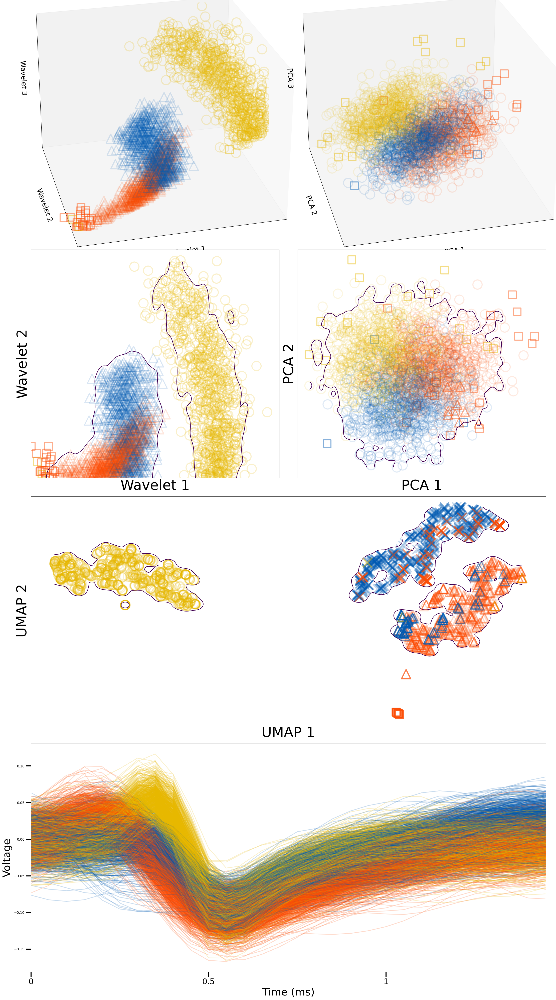

In [6]:
fig = plt.figure(figsize=(22, 40))
gs = gridspec.GridSpec(4, 2)

s_kwargs = {'marker':'s', "rasterized":True, "facecolors":'none', 's':500, 'linewidth':3}
tri_kwargs = { 'marker':'^', "rasterized":True, "facecolors":'none', 's':700, 'linewidth':3}
ci_kwargs = {'marker':'o', "rasterized":True, "facecolors":'none', 's':700, 'linewidth':3}
x_kwargs = {'marker':'x', "rasterized":True, 's':700, 'linewidth':4}

# -----------------WAVELETS
# 3d
a_vec = a_labs(wave_labs)
ax1 = fig.add_subplot(4, 2, 1, projection='3d')

ax1.scatter(*dims(wave_emb, wave_labs == -1), edgecolors=col_vec[wave_labs==-1], **s_kwargs, alpha=a_vec[0])
ax1.scatter(*dims(wave_emb, wave_labs == 0), edgecolors=col_vec[wave_labs==0], **ci_kwargs, alpha=a_vec[1])
ax1.scatter(*dims(wave_emb, wave_labs == 1), edgecolors=col_vec[wave_labs==1], **tri_kwargs, alpha=a_vec[2])
#ax1.scatter(*dims(wave_emb, wave_labs == 2), c=col_vec[wave_labs==2], **x_kwargs, alpha=a_vec[3])
fix_3d_plot(ax1, label="Wavelet", elev=26, azim=-104, xlim=(0, 0.5), zlim=(-0.05, 1.2))

#2D
ax3 = fig.add_subplot(4, 2, 3)

ax3.scatter(*dims(wave_emb, wave_labs == -1, d=2), edgecolors=col_vec[wave_labs==-1], **s_kwargs, alpha=a_vec[0])
ax3.scatter(*dims(wave_emb, wave_labs == 0, d=2), edgecolors=col_vec[wave_labs==0], **ci_kwargs, alpha=a_vec[1])
ax3.scatter(*dims(wave_emb, wave_labs == 1, d=2), edgecolors=col_vec[wave_labs==1], **tri_kwargs, alpha=a_vec[2])
#ax3.scatter(*dims(wave_emb, wave_labs == 2, d=2), c=col_vec[wave_labs==2], **x_kwargs, alpha=a_vec[3])

x, y = grid_axis(wave_emb[:,:2], 3)
ax3.contour(x,y,Prob_grids[1][:-1,:]/Prob_grids[1].max(), levels = [0.025])

ax3.set_ylabel("Wavelet 2", size=40); ax3.set_xlabel("Wavelet 1", size=40)
ax3.set_xticks([]); ax3.set_yticks([])


# ----------------------PCA
# 3D
a_vec = a_labs(pca_labs)
ax2 = fig.add_subplot(4, 2, 2, projection='3d')

ax2.scatter(*dims(pca_emb, pca_labs == -1), edgecolors=col_vec[pca_labs==-1],  **s_kwargs, alpha=a_vec[0])
ax2.scatter(*dims(pca_emb, pca_labs == 0), edgecolors=col_vec[pca_labs==0], **ci_kwargs, alpha=a_vec[1])
ax2.scatter(*dims(pca_emb, pca_labs == 1), edgecolors=col_vec[pca_labs==1], **tri_kwargs, alpha=a_vec[2])
#ax2.scatter(*dims(pca_emb, pca_labs == 2), c=col_vec[pca_labs==2], **x_kwargs, alpha=a_vec[3])
fix_3d_plot(ax2, label="PCA", elev=26, azim=-104, xlim=(-2.4, 3.1), zlim=(-1.5, 2.1), ylim=(-1.9, 2.4))

# 2D
ax4 = fig.add_subplot(4, 2, 4)

ax4.scatter(*dims(pca_emb, pca_labs == -1, d=2), edgecolors=col_vec[pca_labs==-1], **s_kwargs, alpha=a_vec[0])
ax4.scatter(*dims(pca_emb, pca_labs == 0, d=2), edgecolors=col_vec[pca_labs==0], **ci_kwargs, alpha=a_vec[1])
ax4.scatter(*dims(pca_emb, pca_labs == 1, d=2), edgecolors=col_vec[pca_labs==1], **tri_kwargs, alpha=a_vec[2])
#ax4.scatter(*dims(pca_emb, pca_labs == 2, d=2), c=col_vec[pca_labs==2], **x_kwargs, alpha=a_vec[3])

x, y = grid_axis(pca_emb[:,:2], 2)
ax4.contour(x[:-1],y,Prob_grids[2]/Prob_grids[2].max(), levels = [0.025])

ax4.set_ylabel("PCA 2", size=40); ax4.set_xlabel("PCA 1", size=40)
ax4.set_xticks([]); ax4.set_yticks([])

#-------------- UMAP PLOT---------------------
ax6 = fig.add_subplot(gs[2, :])
# misclassification mask
umap_mask = umap_labs == gt_labs
a_vec = a_labs(umap_labs)

ax6.scatter(*dims(umap_emb, umap_labs == -1, d=2), edgecolors=col_vec[(umap_labs==-1)], **s_kwargs, alpha=a_vec[0])
ax6.scatter(*dims(umap_emb, umap_mask*(umap_labs==0), d=2), edgecolors=col_vec[umap_mask * (umap_labs==0)], **ci_kwargs, alpha=a_vec[1])
ax6.scatter(*dims(umap_emb, umap_mask*(umap_labs==1), d=2), edgecolors=col_vec[umap_mask * (umap_labs==1)], **tri_kwargs, alpha=a_vec[2])
ax6.scatter(*dims(umap_emb, umap_mask*(umap_labs==2), d=2), c=col_vec[umap_mask * (umap_labs==2)], **x_kwargs, alpha=a_vec[3])

x, y = grid_axis(umap_emb, 2)
ax6.contour(x,y,Prob_grids[0]/Prob_grids[0].max(), levels = [0.025])

ax6.scatter(*dims(umap_emb, ~umap_mask*(umap_labs == 0), d=2), edgecolors=col_vec[~umap_mask * (umap_labs==0)], **ci_kwargs, alpha=0.5)
ax6.scatter(*dims(umap_emb, ~umap_mask*(umap_labs == 1), d=2), edgecolors=col_vec[~umap_mask * (umap_labs==1)], **tri_kwargs, alpha=0.5)
ax6.scatter(*dims(umap_emb, ~umap_mask*(umap_labs == 2), d=2), c=col_vec[~umap_mask * (umap_labs==2)], **x_kwargs, alpha=0.5)

ax6.set_xticks([]); ax6.set_yticks([])
ax6.set_ylabel("UMAP 2", size=40); ax6.set_xlabel("UMAP 1", size=40)
# ---------------- SPIKES --------------------
ax7 = fig.add_subplot(gs[3, :])
for j, i in enumerate(spikes_aligned):
    ax7.plot(i / 10, color=pal_curves[int(umap_labs[j])], alpha=0.2, linewidth=2, rasterized=True)

plt.grid(visible=False)
#ax7.set_yticks([])
ax7.set_xlim(0, 29)
ax7.set_xticks([0, 10, 20])
ax7.set_xticklabels([0, 0.5, 1], size=23)

ax7.spines['bottom'].set_color('0.5')
ax7.tick_params('both', length=15, width=3, which='major')
ax7.set_xlabel("Time (ms)", size=30)
ax7.set_ylabel("Voltage", size=30)

plt.tight_layout()
#plt.savefig("fig3.pdf", dpi=400)
#plt.savefig("fig3.svg")

In [40]:
s_kwargs = {'marker':'s', "rasterized":False, "facecolors":'none', 's':500, 'linewidth':3}
tri_kwargs = { 'marker':'^', "rasterized":False, "facecolors":'none', 's':700, 'linewidth':3}
ci_kwargs = {'marker':'o', "rasterized":False, "facecolors":'none', 's':700, 'linewidth':3}
x_kwargs = {'marker':'x', "rasterized":False, 's':700, 'linewidth':4}

C:\Users\RRlab_IFC_1\AppData\Local\Temp\ipykernel_1264\300319594.py:22: MatplotlibDeprecationWarning: The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  ax.dist = dist


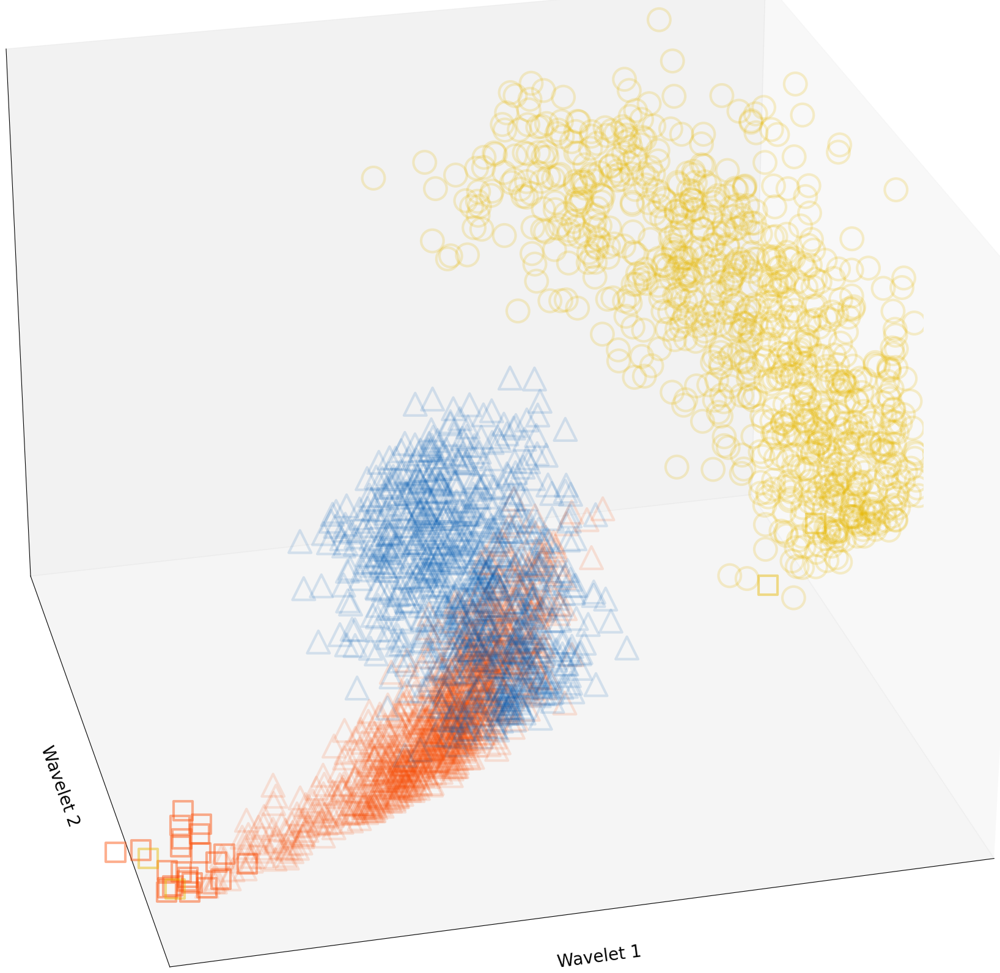

In [38]:
fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(4, 2)
a_vec = a_labs(wave_labs)
ax1 = fig.add_subplot(111, projection='3d')

ax1.scatter(*dims(wave_emb, wave_labs == -1), edgecolors=col_vec[wave_labs==-1], **s_kwargs, alpha=a_vec[0])
ax1.scatter(*dims(wave_emb, wave_labs == 0), edgecolors=col_vec[wave_labs==0], **ci_kwargs, alpha=a_vec[1])
ax1.scatter(*dims(wave_emb, wave_labs == 1), edgecolors=col_vec[wave_labs==1], **tri_kwargs, alpha=a_vec[2])
#ax1.scatter(*dims(wave_emb, wave_labs == 2), c=col_vec[wave_labs==2], **x_kwargs, alpha=a_vec[3])
fix_3d_plot(ax1, label="Wavelet", elev=26, azim=-104, xlim=(0, 0.5), zlim=(-0.05, 1.2))
plt.grid(visible=False)
plt.tight_layout()
plt.savefig("wavelet3d.svg")

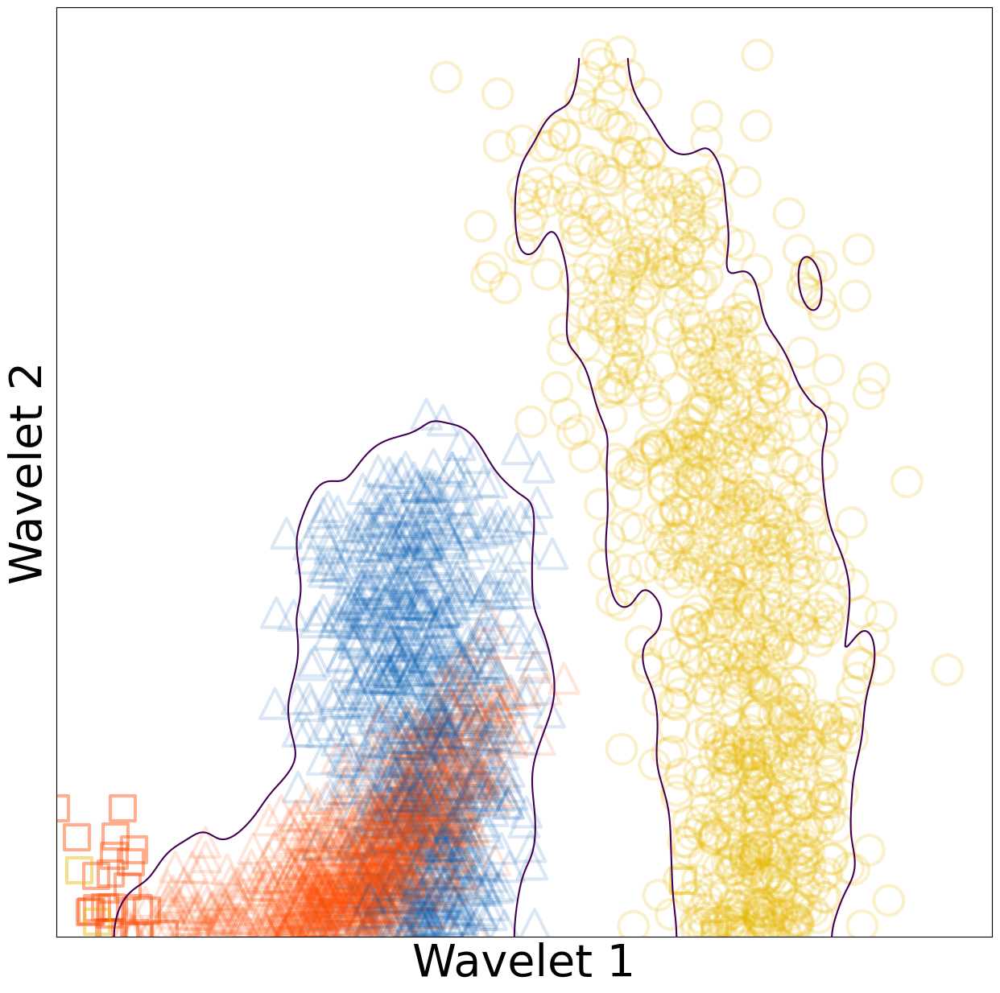

In [41]:
fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(4, 2)
ax3 = fig.add_subplot(111)

ax3.scatter(*dims(wave_emb, wave_labs == -1, d=2), edgecolors=col_vec[wave_labs==-1], **s_kwargs, alpha=a_vec[0])
ax3.scatter(*dims(wave_emb, wave_labs == 0, d=2), edgecolors=col_vec[wave_labs==0], **ci_kwargs, alpha=a_vec[1])
ax3.scatter(*dims(wave_emb, wave_labs == 1, d=2), edgecolors=col_vec[wave_labs==1], **tri_kwargs, alpha=a_vec[2])
#ax3.scatter(*dims(wave_emb, wave_labs == 2, d=2), c=col_vec[wave_labs==2], **x_kwargs, alpha=a_vec[3])

x, y = grid_axis(wave_emb[:,:2], 3)
ax3.contour(x,y,Prob_grids[1][:-1,:]/Prob_grids[1].max(), levels = [0.025])

ax3.set_ylabel("Wavelet 2", size=40); ax3.set_xlabel("Wavelet 1", size=40)
ax3.set_xticks([]); ax3.set_yticks([])
plt.savefig("wavelet2d.svg")

C:\Users\RRlab_IFC_1\AppData\Local\Temp\ipykernel_1264\300319594.py:22: MatplotlibDeprecationWarning: The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  ax.dist = dist


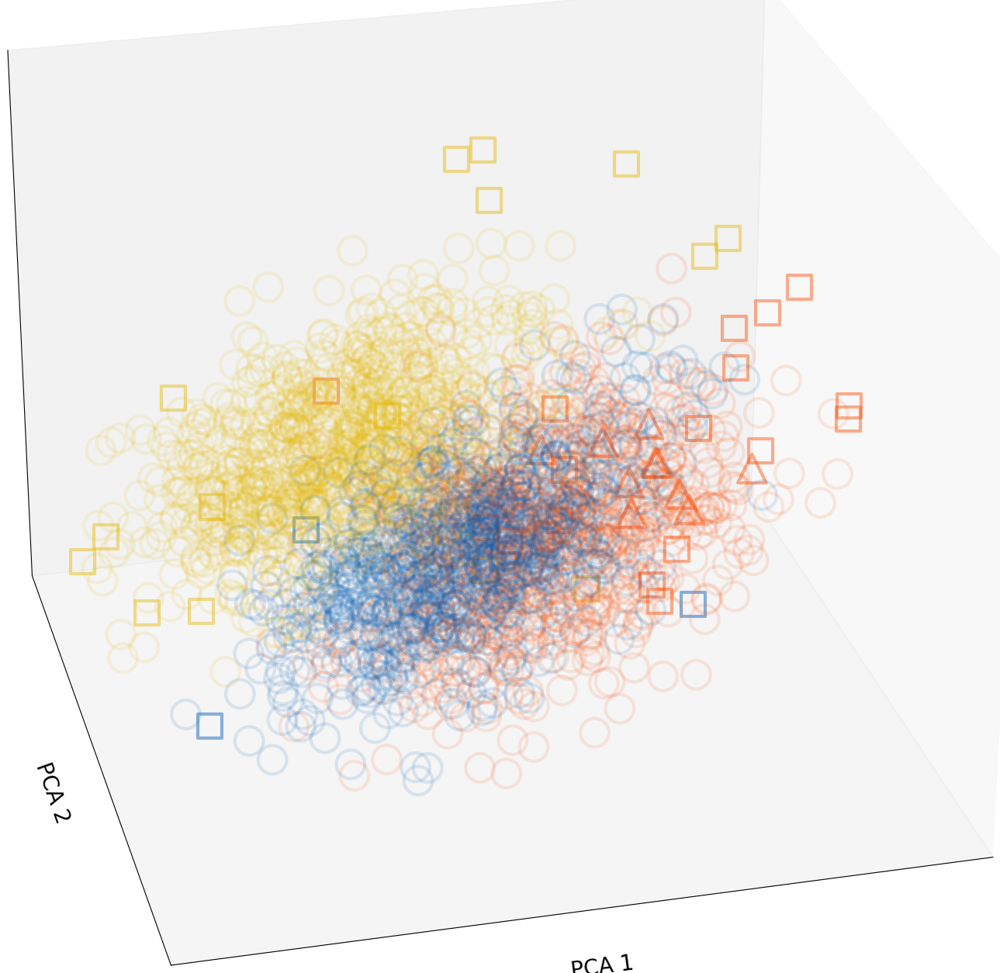

In [42]:
a_vec = a_labs(pca_labs)
fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(4, 2)
ax2 = fig.add_subplot(111, projection='3d')

ax2.scatter(*dims(pca_emb, pca_labs == -1), edgecolors=col_vec[pca_labs==-1],  **s_kwargs, alpha=a_vec[0])
ax2.scatter(*dims(pca_emb, pca_labs == 0), edgecolors=col_vec[pca_labs==0], **ci_kwargs, alpha=a_vec[1])
ax2.scatter(*dims(pca_emb, pca_labs == 1), edgecolors=col_vec[pca_labs==1], **tri_kwargs, alpha=a_vec[2])
#ax2.scatter(*dims(pca_emb, pca_labs == 2), c=col_vec[pca_labs==2], **x_kwargs, alpha=a_vec[3])
fix_3d_plot(ax2, label="PCA", elev=26, azim=-104, xlim=(-2.4, 3.1), zlim=(-1.5, 2.1), ylim=(-1.9, 2.4))
plt.savefig("pca3d.svg")

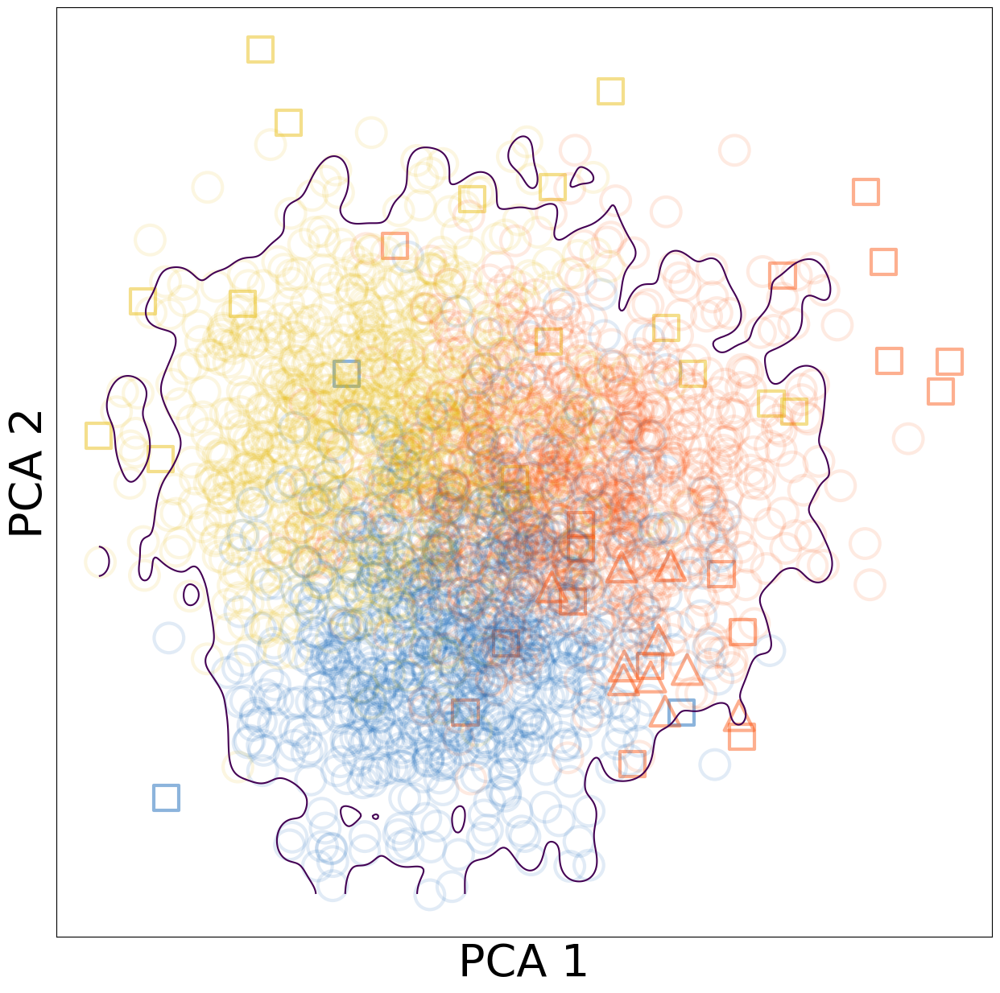

In [43]:
fig = plt.figure(figsize=(15, 15))
gs = gridspec.GridSpec(4, 2)
ax4 = fig.add_subplot(111)

ax4.scatter(*dims(pca_emb, pca_labs == -1, d=2), edgecolors=col_vec[pca_labs==-1], **s_kwargs, alpha=a_vec[0])
ax4.scatter(*dims(pca_emb, pca_labs == 0, d=2), edgecolors=col_vec[pca_labs==0], **ci_kwargs, alpha=a_vec[1])
ax4.scatter(*dims(pca_emb, pca_labs == 1, d=2), edgecolors=col_vec[pca_labs==1], **tri_kwargs, alpha=a_vec[2])
#ax4.scatter(*dims(pca_emb, pca_labs == 2, d=2), c=col_vec[pca_labs==2], **x_kwargs, alpha=a_vec[3])

x, y = grid_axis(pca_emb[:,:2], 2)
ax4.contour(x[:-1],y,Prob_grids[2]/Prob_grids[2].max(), levels = [0.025])

ax4.set_ylabel("PCA 2", size=40); ax4.set_xlabel("PCA 1", size=40)
ax4.set_xticks([]); ax4.set_yticks([])
plt.savefig("pca2d.svg")

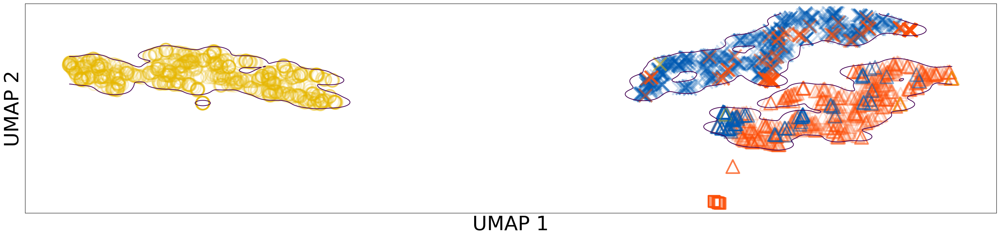

In [53]:
fig = plt.figure(figsize=(35, 35))
gs = gridspec.GridSpec(4, 2)
ax6 = fig.add_subplot(gs[2, :])
# misclassification mask
umap_mask = umap_labs == gt_labs
a_vec = a_labs(umap_labs)

ax6.scatter(*dims(umap_emb, umap_labs == -1, d=2), edgecolors=col_vec[(umap_labs==-1)], **s_kwargs, alpha=a_vec[0])
ax6.scatter(*dims(umap_emb, umap_mask*(umap_labs==0), d=2), edgecolors=col_vec[umap_mask * (umap_labs==0)], **ci_kwargs, alpha=a_vec[1])
ax6.scatter(*dims(umap_emb, umap_mask*(umap_labs==1), d=2), edgecolors=col_vec[umap_mask * (umap_labs==1)], **tri_kwargs, alpha=a_vec[2])
ax6.scatter(*dims(umap_emb, umap_mask*(umap_labs==2), d=2), c=col_vec[umap_mask * (umap_labs==2)], **x_kwargs, alpha=a_vec[3])

x, y = grid_axis(umap_emb, 2)
ax6.contour(x,y,Prob_grids[0]/Prob_grids[0].max(), levels = [0.025])

ax6.scatter(*dims(umap_emb, ~umap_mask*(umap_labs == 0), d=2), edgecolors=col_vec[~umap_mask * (umap_labs==0)], **ci_kwargs, alpha=0.5)
ax6.scatter(*dims(umap_emb, ~umap_mask*(umap_labs == 1), d=2), edgecolors=col_vec[~umap_mask * (umap_labs==1)], **tri_kwargs, alpha=0.5)
ax6.scatter(*dims(umap_emb, ~umap_mask*(umap_labs == 2), d=2), c=col_vec[~umap_mask * (umap_labs==2)], **x_kwargs, alpha=0.5)

ax6.set_xticks([]); ax6.set_yticks([])
ax6.set_ylabel("UMAP 2", size=40); ax6.set_xlabel("UMAP 1", size=40)
plt.savefig("UMAP2d.svg")

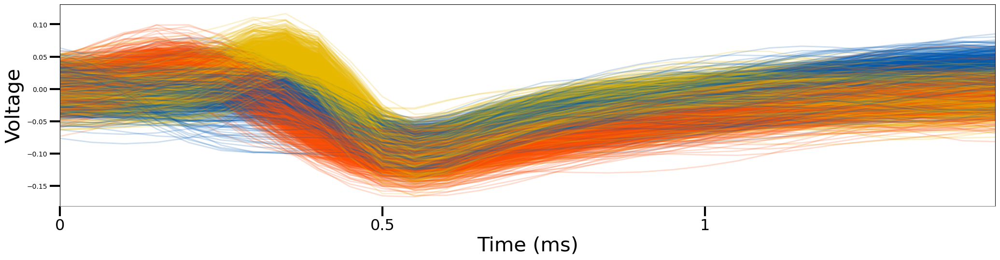

In [56]:
fig = plt.figure(figsize=(25, 25))
gs = gridspec.GridSpec(4, 2)
ax7 = fig.add_subplot(gs[3, :])
for j, i in enumerate(spikes_aligned):
    ax7.plot(i / 10, color=pal_curves[int(umap_labs[j])], alpha=0.2, linewidth=2, rasterized=False)

plt.grid(visible=False)
#ax7.set_yticks([])
ax7.set_xlim(0, 29)
ax7.set_xticks([0, 10, 20])
ax7.set_xticklabels([0, 0.5, 1], size=23)

ax7.spines['bottom'].set_color('0.5')
ax7.tick_params('both', length=15, width=3, which='major')
ax7.set_xlabel("Time (ms)", size=30)
ax7.set_ylabel("Voltage", size=30)
plt.savefig("espigasxcluster.svg")